In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os
import cv2
from glob import glob
import random
import torch
from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import tqdm
from torch import nn

In [2]:
random.seed(42)
np.random.seed(42)
torch.manual_seed(0)

In [3]:
df = pd.read_csv("../datasets/waterbird/metadata.csv")
df.head(5)

,img_id,img_filename,y,split,place,place_filename
0,1,001.Black_footed_Albatross/Black_Footed_Albatr...,1,2,1,/o/ocean/00002178.jpg
1,2,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,1,/l/lake/natural/00000065.jpg
2,3,001.Black_footed_Albatross/Black_Footed_Albatr...,1,2,0,/b/bamboo_forest/00000131.jpg
3,4,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,1,/o/ocean/00001268.jpg
4,5,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,1,/o/ocean/00003147.jpg


In [4]:
LANDBIRD = 0
WATERBIRD = 1
LAND = 0
WATER = 1

In [5]:
train_df = df[df['split'] == 0]
val_df = df[df['split'] == 1]
test_df = df[df['split'] == 2]

len(train_df), len(test_df), len(val_df)

(4795, 5794, 1199)

## Plot random images from dataset

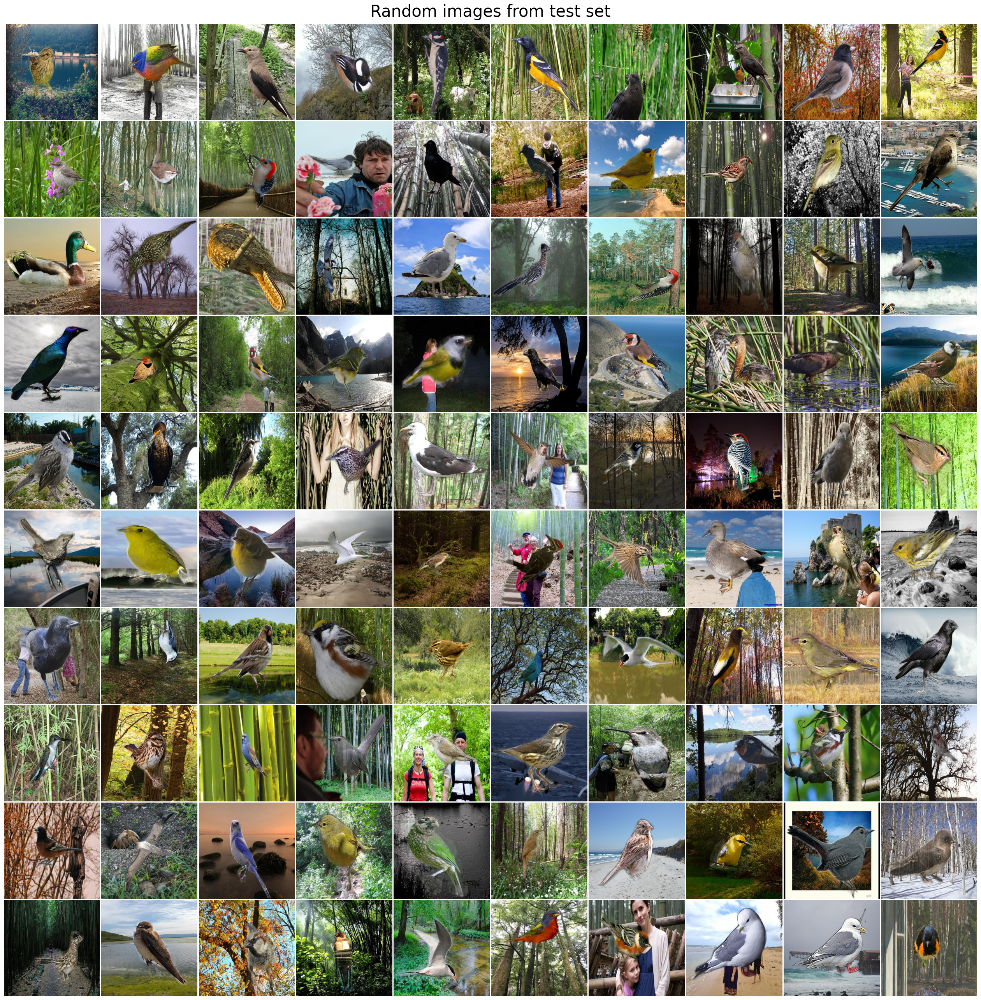

In [6]:
n_images = 100
idx = np.random.randint(0, len(df), n_images)
img_paths, places = list(df.iloc[idx]['img_filename']), list(
    df.iloc[idx]['place'])

fig, axes = plt.subplots(10, 10, figsize=(25, 25))

for img_path, place, ax in zip(img_paths, places, axes.flatten()):
    img_path = os.path.join("../datasets/waterbird", img_path)
    img = Image.open(img_path)
    place = "land" if place == 0 else "water"
    img = img.resize((500, 500))
    ax.imshow(img)
    # ax.set_title(f'Place: {place}')
    ax.axis("off")

fig.suptitle("Random images from test set", fontsize=30, ha='center', va='top', x=0.5, y=1.02)
plt.subplots_adjust(wspace=0.015, hspace=0, left=0, right=1, bottom=0, top=1)
plt.show()

## Statistics

In [7]:
num_landbird = df[df['y'] == LANDBIRD].shape[0]
num_waterbird = df[df['y'] == WATERBIRD].shape[0]
land_bird_on_land = df[(df['place'] == LAND) & (df['y'] == LANDBIRD)].shape[0]
waterbird_on_water = df[(df['place'] == WATER) & (df['y'] == WATERBIRD)].shape[0]
land_bird_on_water = df[(df['place'] == WATER) & (df['y'] == LANDBIRD)].shape[0]
water_bird_on_land = df[(df['place'] == LAND) &(df['y'] == WATERBIRD)].shape[0]

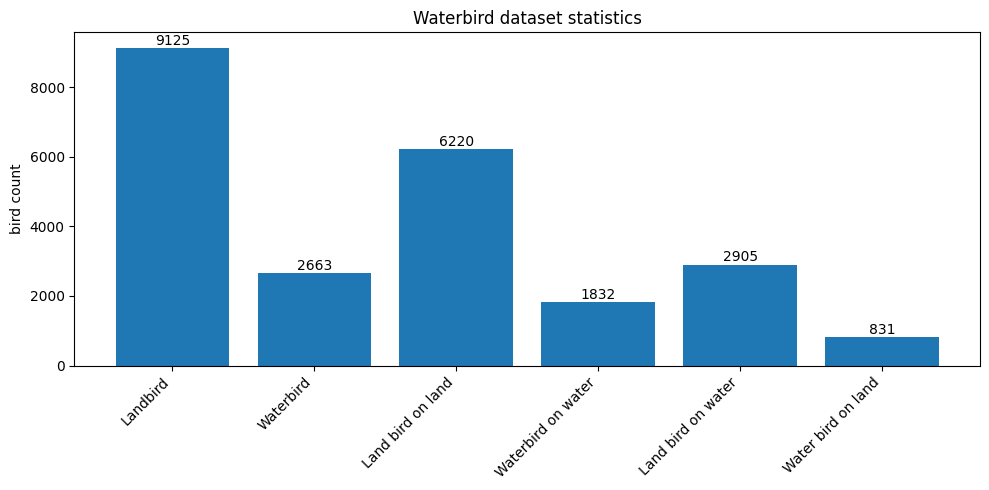

In [8]:
birds_count = ['Landbird', 'Waterbird',
               'Land bird on land', 'Waterbird on water', 'Land bird on water', 'Water bird on land']
counts = [num_landbird, num_waterbird,
          land_bird_on_land, waterbird_on_water, land_bird_on_water, water_bird_on_land]

plt.figure(figsize=(10, 5))
bars = plt.bar(birds_count, counts)
plt.ylabel("bird count")
plt.title('Waterbird dataset statistics')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, int(yval), ha='center', va='bottom')

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [9]:
def show_statistics(title:str, split=0):
    land_bird_on_land = df[(df['place'] == LAND) & (df['y'] == LANDBIRD) & (df['split'] == split)].shape[0]
    waterbird_on_water = df[(df['place'] == WATER) &
                            (df['y'] == WATERBIRD) & (df['split'] == split)].shape[0]
    land_bird_on_water = df[(df['place'] == WATER) &
                            (df['y'] == LANDBIRD) & (df['split'] == split)].shape[0]
    water_bird_on_land = df[(df['place'] == LAND) & (
        df['y'] == WATERBIRD) & (df['split'] == split)].shape[0]
    
    birds_count = ['Land bird on land', 'Waterbird on water', 'Land bird on water', 'Water bird on land']

    counts = [land_bird_on_land, waterbird_on_water, land_bird_on_water, water_bird_on_land]

    plt.figure(figsize=(10, 5))
    bars = plt.bar(birds_count, counts)
    plt.ylabel("bird count")
    plt.title(title)

    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval +
                0.5, int(yval), ha='center', va='bottom')
    
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

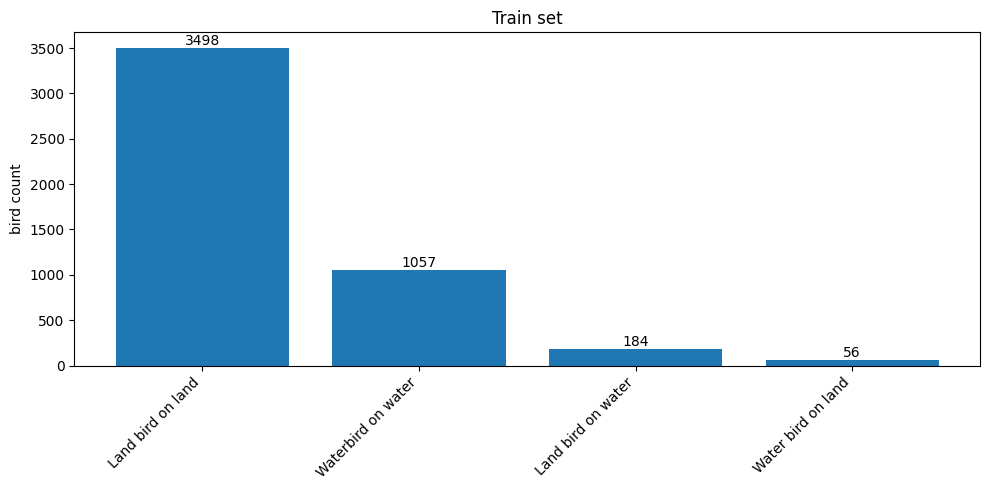

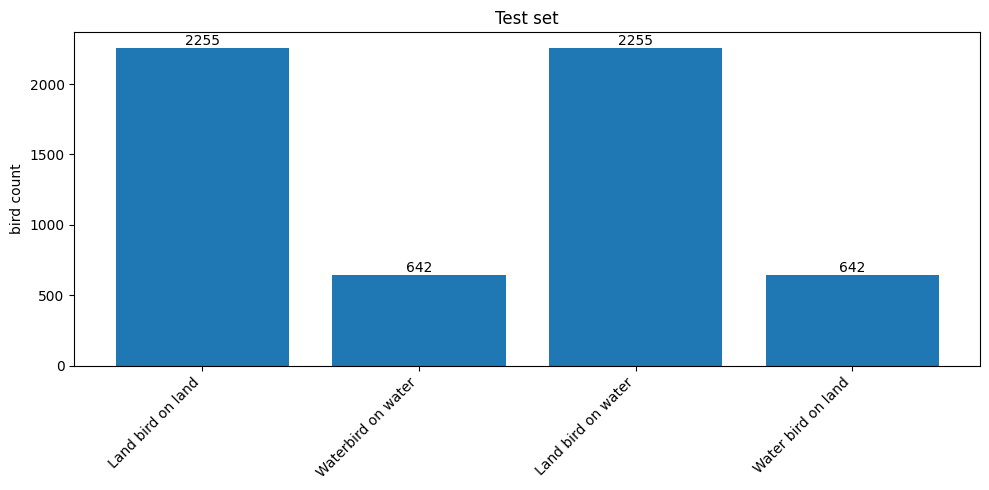

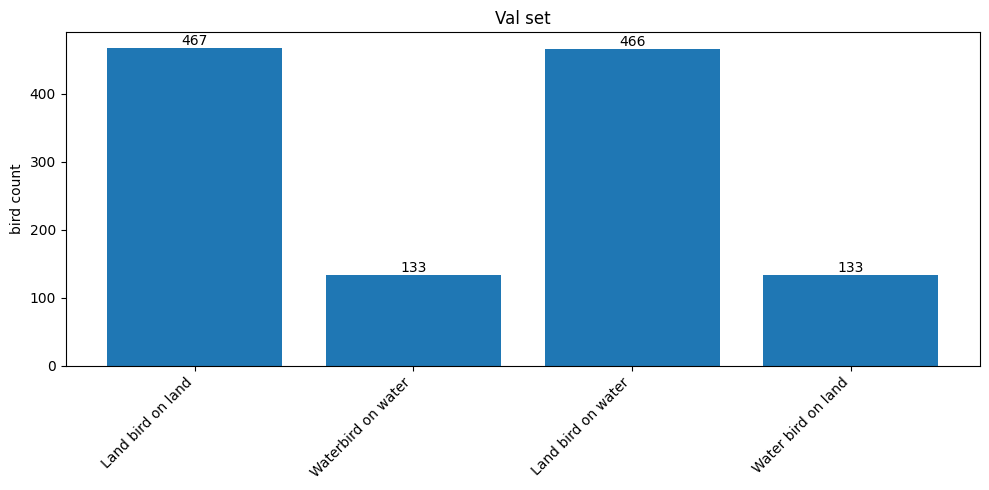

In [10]:
train_split = 0 # train
val_split = 1 # val
test_split = 2 # test

show_statistics(split=train_split, title="Train set")
show_statistics(split=test_split, title="Test set")
show_statistics(split=val_split, title="Val set")

In [11]:
def plot_heatmap(landbird_on_land,
                 landbird_on_water,
                 waterbird_on_water,
                 waterbird_on_land,
                 title,
                 project_on_image=False):

    nrows, ncols = 4, 10
    fig = plt.figure(figsize=(25, 40))

    subfigs = fig.subfigures(nrows, 1)
    subfig_titles = ['landbird on land', 'landbird on water',
                     'waterbird on water', 'waterbird on land']

    for subfig, subtitle, entry in zip(subfigs, subfig_titles, [landbird_on_land, landbird_on_water, waterbird_on_water, waterbird_on_land]):

        axs = subfig.subplots(4, ncols)
        subfig.suptitle(subtitle, fontsize=17,  ha='center',
                        va='top', x=0.5, y=0.94)
        idx = 0

        for i in range(ncols):
            img_path = os.path.join("./datasets/waterbird", entry[idx]['img_filename'])
            img = Image.open(img_path)
            img = img.resize((500, 500))
            axs[0, i].imshow(img)
            axs[0, i].axis('off')
            # axs[0, i].set_title(f"true: {entry[idx]['img_label']} | pred: {entry[idx]['predicted']}")

            heatmap = entry[idx]['heatmap']
            heatmap = cv2.resize(heatmap, (500, 500))
            if project_on_image:
                axs[1, i].imshow(img)
                axs[1, i].imshow(heatmap, cmap='jet', alpha=0.5)
            else:
                axs[1, i].imshow(heatmap, cmap='jet', alpha=0.85)
            axs[1, i].axis('off')

            img_path = os.path.join("./datasets/waterbird", entry[idx + ncols]['img_filename'])
            img = Image.open(img_path)
            img = img.resize((500, 500))
            axs[2, i].imshow(img)
            axs[2, i].axis('off')
            # axs[2, i].set_title(f"true: {entry[idx + ncols]['img_label']} | pred: {entry[idx + ncols]['predicted']}")

            heatmap = entry[idx + ncols]['heatmap']
            heatmap = cv2.resize(heatmap, (500, 500))
            if project_on_image:
                axs[3, i].imshow(img)
                axs[3, i].imshow(heatmap, cmap='jet', alpha=0.5)
            else:
                axs[3, i].imshow(heatmap, cmap='jet', alpha=0.85)
            axs[3, i].axis('off')
            idx += 1
    

    fig.suptitle(title, fontsize=20,
                 ha='center', va='top', x=0.5, y=1.01)
    plt.subplots_adjust(hspace=0.01, wspace=0.01)
    plt.show()

In [12]:
performance_report = np.load("D:\Download\Waterbird\PaliGemma\landbird_or_waterbird\Trained\landbird_or_waterbird_trained.npy", allow_pickle=True)

# for entry in performance_report:
#     if entry['predicted'] == 'landbird':
#         entry['predicted'] = LANDBIRD
#     else:
#         entry['predicted'] = WATERBIRD
true_labels = [x['img_label'] for x in performance_report]
predicted_labels = [x['predicted'] for x in performance_report]
place = [x['place'] for x in performance_report]

In [14]:
landbird_on_land = []
landbird_on_water = []
waterbird_on_land = []
waterbird_on_water = []

predicted_landbird_on_land = []
predicted_landbird_on_water = []
predicted_waterbird_on_land = []
predicted_waterbird_on_water = []

predicted_landbird_on_land_correct = []
predicted_landbird_on_land_incorrect = []

predicted_landbird_on_water_correct = []
predicted_landbird_on_water_incorrect = []

predicted_waterbird_on_land_correct = []
predicted_waterbird_on_land_incorrect = []

predicted_waterbird_on_water_correct = []
predicted_waterbird_on_water_incorrect = []

for report in performance_report:
    if report['img_label'] == LANDBIRD and report['place'] == LAND:
        landbird_on_land.append(report['img_label'])
        predicted_landbird_on_land.append(report['predicted'])
        if report['img_label'] == report['predicted']:
            predicted_landbird_on_land_correct.append(report)
        else:
            predicted_landbird_on_land_incorrect.append(report)

    elif report['img_label'] == LANDBIRD and report['place'] == WATER:
        landbird_on_water.append(report['img_label'])
        predicted_landbird_on_water.append(report['predicted'])
        if report['img_label'] == report['predicted']:
            predicted_landbird_on_water_correct.append(report)
        else:
            predicted_landbird_on_water_incorrect.append(report)

    elif report['img_label'] == WATERBIRD and report['place'] == LAND:
        waterbird_on_land.append(report['img_label'])
        predicted_waterbird_on_land.append(report['predicted'])
        if report['img_label'] == report['predicted']:
            predicted_waterbird_on_land_correct.append(report)
        else:
            predicted_waterbird_on_land_incorrect.append(report)

    elif report['img_label'] == WATERBIRD and report['place'] == WATER:
        waterbird_on_water.append(report['img_label'])
        predicted_waterbird_on_water.append(report['predicted'])
        if report['img_label'] == report['predicted']:
            predicted_waterbird_on_water_correct.append(report)
        else:
            predicted_waterbird_on_water_incorrect.append(report)

In [27]:
landbird_on_land_acc = np.sum(np.array(landbird_on_land) == np.array(
    predicted_landbird_on_land)) / len(landbird_on_land)

landbird_on_water_acc = np.sum(np.array(landbird_on_water) == np.array(
    predicted_landbird_on_water)) / len(landbird_on_water)

waterbird_on_water_acc = np.sum(np.array(waterbird_on_water) == np.array(
    predicted_waterbird_on_water)) / len(waterbird_on_water)

waterbird_on_land_acc = np.sum(np.array(waterbird_on_land) == np.array(
    predicted_waterbird_on_land)) / len(waterbird_on_land)

print(f"Landbird on land: {landbird_on_land_acc:.2f}")
print(f"Landbird on water: {landbird_on_water_acc:.2f}")
print(f"Waterbird on water: {waterbird_on_water_acc:.2f}")
print(f"Waterbird on land: {waterbird_on_land_acc:.2f}")

Landbird on land: 0.97
Landbird on water: 0.97
Waterbird on water: 0.29
Waterbird on land: 0.31


In [7]:
landbird_on_land_report = classification_report(landbird_on_land, predicted_landbird_on_land, zero_division=True, output_dict=True)
landbird_on_water_report = classification_report(landbird_on_water, predicted_landbird_on_water, zero_division=True, output_dict=True)
waterbird_on_water_report = classification_report(waterbird_on_water, predicted_waterbird_on_water, zero_division=True, output_dict=True)
waterbird_on_land_report = classification_report(waterbird_on_land, predicted_waterbird_on_land, zero_division=True, output_dict=True)
test_set_report = classification_report(true_labels, predicted_labels, output_dict=True)

In [15]:
print("Test set")
print(classification_report(
    true_labels, predicted_labels, output_dict=False))
print("Landbird on land")
print(classification_report(
    landbird_on_land, predicted_landbird_on_land, zero_division=True, output_dict=False))
print("Landbird on water")
print(classification_report(
    landbird_on_water, predicted_landbird_on_water, zero_division=True, output_dict=False))
print("Waterbird on water")
print(classification_report(
    waterbird_on_water, predicted_waterbird_on_water, zero_division=True, output_dict=False))
print("Waterbird on land")
print(classification_report(
    waterbird_on_land, predicted_waterbird_on_land, zero_division=True, output_dict=False))

Test set
              precision    recall  f1-score   support

           0       0.83      0.96      0.89      4510
           1       0.71      0.32      0.44      1284

    accuracy                           0.82      5794
   macro avg       0.77      0.64      0.67      5794
weighted avg       0.80      0.82      0.79      5794

Landbird on land
              precision    recall  f1-score   support

           0       1.00      0.97      0.98      2255
           1       0.00      1.00      0.00         0

    accuracy                           0.97      2255
   macro avg       0.50      0.98      0.49      2255
weighted avg       1.00      0.97      0.98      2255

Landbird on water
              precision    recall  f1-score   support

           0       1.00      0.96      0.98      2255
           1       0.00      1.00      0.00         0

    accuracy                           0.96      2255
   macro avg       0.50      0.98      0.49      2255
weighted avg       1.00      0

In [16]:
groups = ['test_set', 'landbird on land', 'landbird on water',
          'waterbird on water', 'waterbird on land']

scores = {
    'accuracy': [],
    'macro precision': [],
    'macro recall': [],
    'macro f1-score': [],
    'weighted precision': [],
    'weighted recall': [],
    'weighted f1-score': [],
}

for score in [test_set_report, landbird_on_land_report, landbird_on_water_report, waterbird_on_water_report, waterbird_on_land_report]:
    macro_avg = score['macro avg']
    weighted_avg = score['weighted avg']

    scores['accuracy'].append(round(score['accuracy'], 2))

    scores['macro precision'].append(round(macro_avg['precision'], 2))
    scores['macro recall'].append(round(macro_avg['recall'], 2))
    scores['macro f1-score'].append(round(macro_avg['f1-score'], 2))

    scores['weighted precision'].append(round(weighted_avg['precision'], 2))
    scores['weighted recall'].append(round(weighted_avg['recall'], 2))
    scores['weighted f1-score'].append(round(weighted_avg['f1-score'], 2))

width = 0.13
multiplier = 0
x = np.arange(len(groups))

fig, ax = plt.subplots(layout='constrained', figsize=(15, 6), dpi=1000)
for attribute, measurement in scores.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

ax.set_ylabel('Scores')
ax.set_title('PaliGemma Scores (landbird or waterbird group DRO)')
ax.set_xticks(x + width * 3, groups)
ax.legend(loc='upper left', ncols=7)
ax.set_ylim(0, 1.2)

plt.show()